In [26]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/car-price-prediction/CarPrice_Assignment.csv
/kaggle/input/car-price-prediction/Data Dictionary - carprices.xlsx


In [27]:
#Loading the dataset
df = pd.read_csv("/kaggle/input/car-price-prediction/CarPrice_Assignment.csv")
df.head(5)

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


## Univariate Analysis & Visualizations

In [20]:
# Performing EDA using ProfileReport function of ydata_profiling
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title = 'Profile Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [28]:
df['CarName'].unique()

array(['alfa-romero giulia', 'alfa-romero stelvio',
       'alfa-romero Quadrifoglio', 'audi 100 ls', 'audi 100ls',
       'audi fox', 'audi 5000', 'audi 4000', 'audi 5000s (diesel)',
       'bmw 320i', 'bmw x1', 'bmw x3', 'bmw z4', 'bmw x4', 'bmw x5',
       'chevrolet impala', 'chevrolet monte carlo', 'chevrolet vega 2300',
       'dodge rampage', 'dodge challenger se', 'dodge d200',
       'dodge monaco (sw)', 'dodge colt hardtop', 'dodge colt (sw)',
       'dodge coronet custom', 'dodge dart custom',
       'dodge coronet custom (sw)', 'honda civic', 'honda civic cvcc',
       'honda accord cvcc', 'honda accord lx', 'honda civic 1500 gl',
       'honda accord', 'honda civic 1300', 'honda prelude',
       'honda civic (auto)', 'isuzu MU-X', 'isuzu D-Max ',
       'isuzu D-Max V-Cross', 'jaguar xj', 'jaguar xf', 'jaguar xk',
       'maxda rx3', 'maxda glc deluxe', 'mazda rx2 coupe', 'mazda rx-4',
       'mazda glc deluxe', 'mazda 626', 'mazda glc', 'mazda rx-7 gs',
       'mazda glc 

In [29]:
# Since the number of values in the CarName column are so many, we need to reduce it
# Here we created a function that reduces the CarName to only car brands

def clean_car_name(car_name: str)->str:
    return car_name.split(' ')[0].lower()

In [30]:
df['CarName'] = df['CarName'].apply(clean_car_name)
df['CarName'].unique()

array(['alfa-romero', 'audi', 'bmw', 'chevrolet', 'dodge', 'honda',
       'isuzu', 'jaguar', 'maxda', 'mazda', 'buick', 'mercury',
       'mitsubishi', 'nissan', 'peugeot', 'plymouth', 'porsche',
       'porcshce', 'renault', 'saab', 'subaru', 'toyota', 'toyouta',
       'vokswagen', 'volkswagen', 'vw', 'volvo'], dtype=object)

In [31]:
#Correcting names of the car brands

df['CarName'] = df['CarName'].replace({'maxda':'mazda', 'porcshce':'porsche', 
                                       'toyouta':'toyota', 'vokswagen':'volkswagen',
                                       'vw':'volkswagen'})

In [32]:
df['CarName'].unique()

array(['alfa-romero', 'audi', 'bmw', 'chevrolet', 'dodge', 'honda',
       'isuzu', 'jaguar', 'mazda', 'buick', 'mercury', 'mitsubishi',
       'nissan', 'peugeot', 'plymouth', 'porsche', 'renault', 'saab',
       'subaru', 'toyota', 'volkswagen', 'volvo'], dtype=object)

In [33]:
df['CarName'].nunique()

22

In [34]:
def count_plot(column_name, hue = None, rotation = 0):
    
    graph = sns.countplot(x = column_name, data = df, hue = hue)
    for container in graph.containers:
        graph.bar_label(container)
        
    plt.xticks(rotation = rotation)
    plt.show()

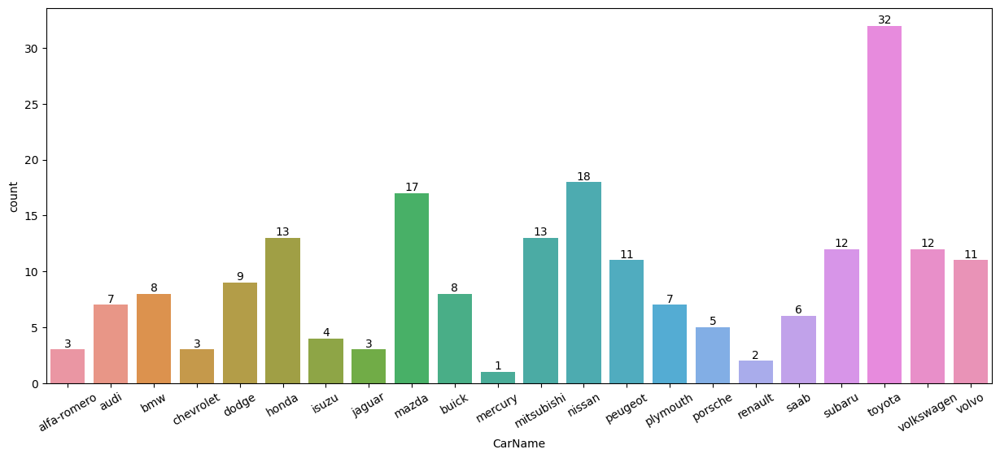

In [35]:
plt.figure(figsize=(15,6))
count_plot(column_name = "CarName", rotation = 30)
plt.show()

## Bivariate Analysis & Visualizations

In [36]:
#Creating a list of Categorical colums

category_column = df.select_dtypes(include = object).columns.tolist()
category_column

['CarName',
 'fueltype',
 'aspiration',
 'doornumber',
 'carbody',
 'drivewheel',
 'enginelocation',
 'enginetype',
 'cylindernumber',
 'fuelsystem']

In [37]:
def create_boxplot(x_axis, columns):
        sns.boxplot(y = x_axis, x  = columns, data = df)
        
        plt.show()

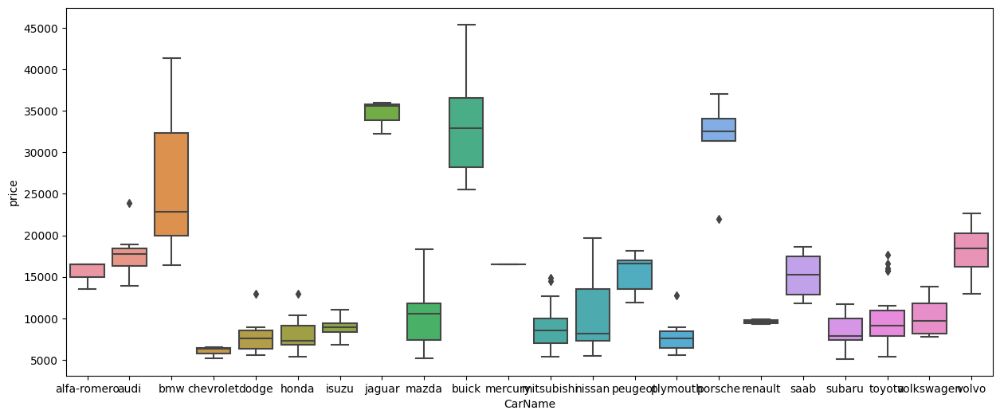

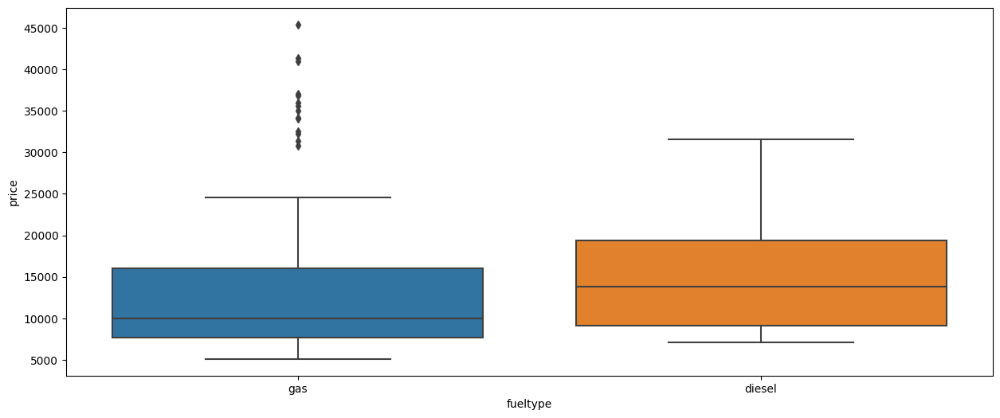

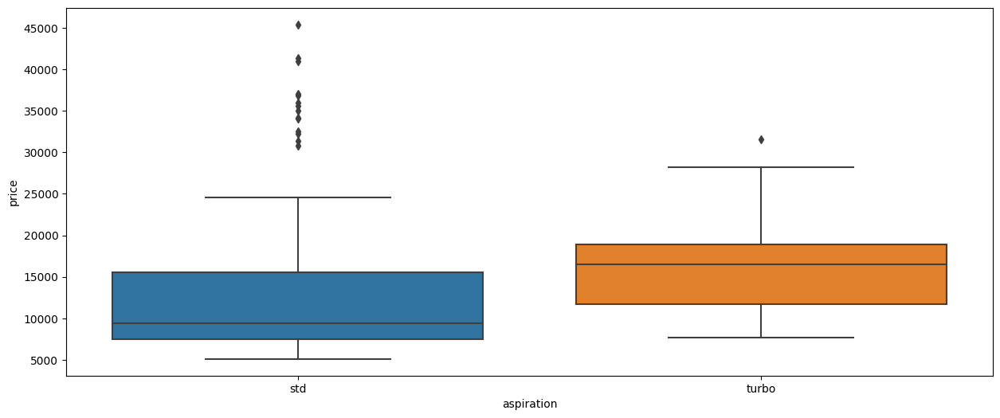

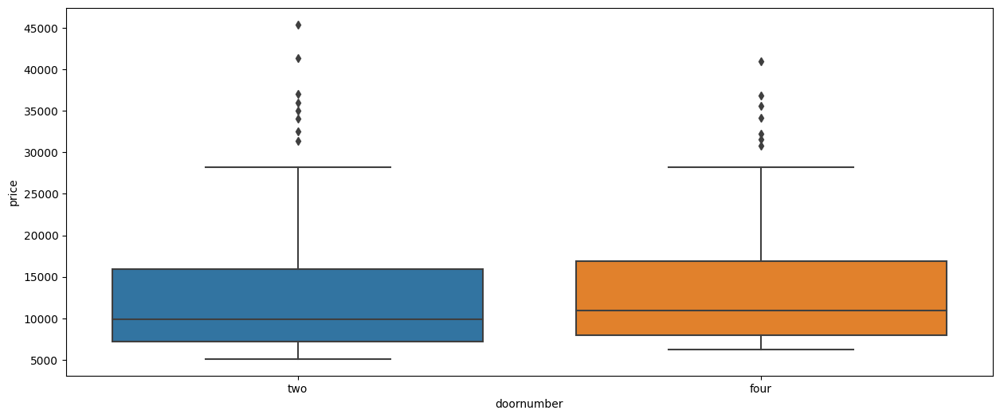

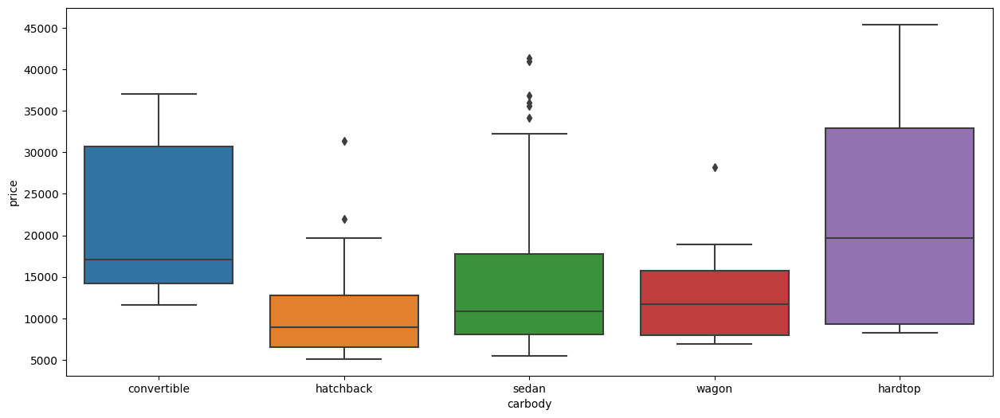

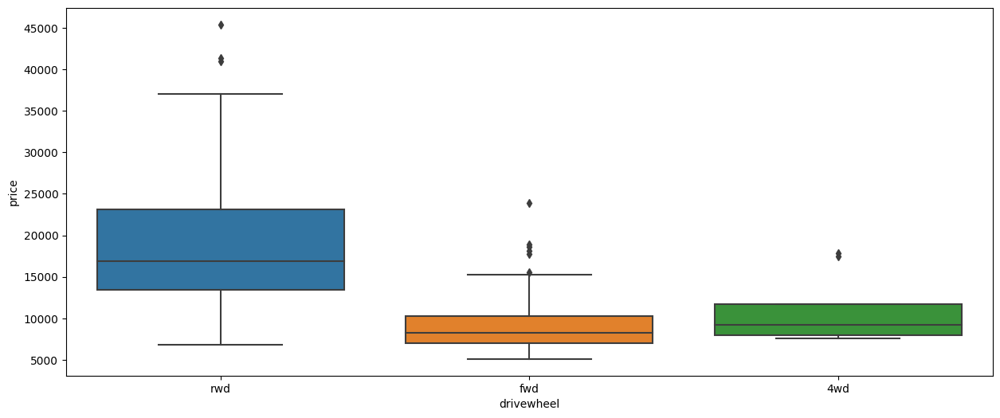

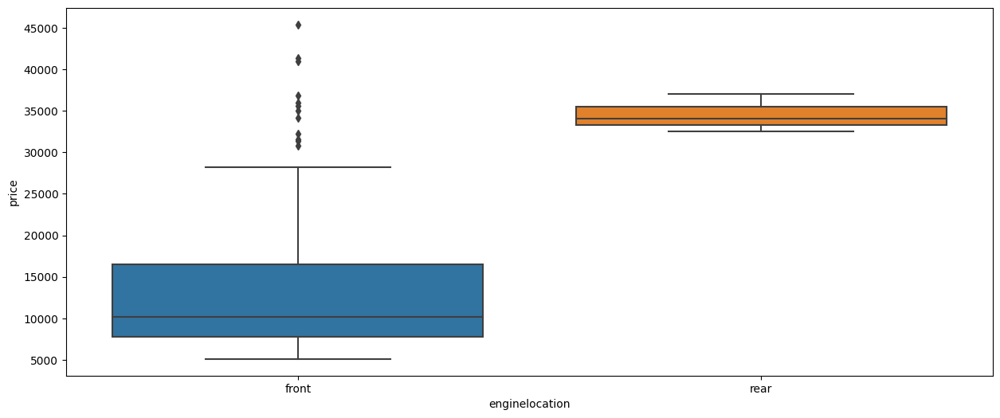

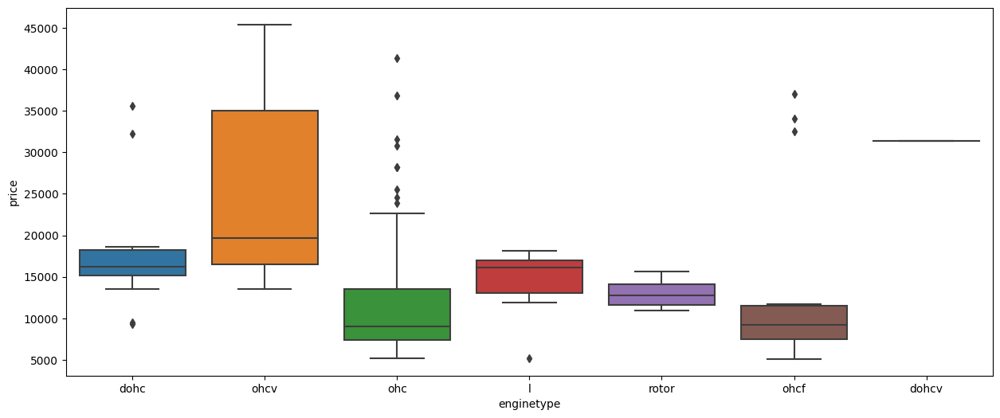

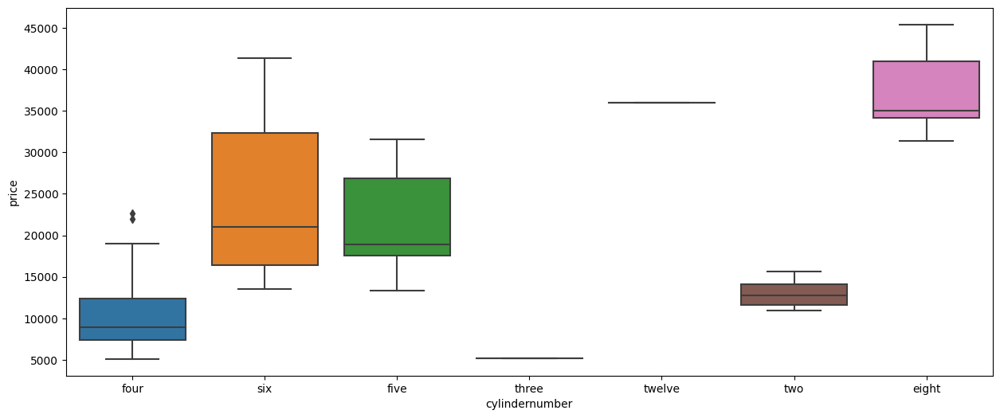

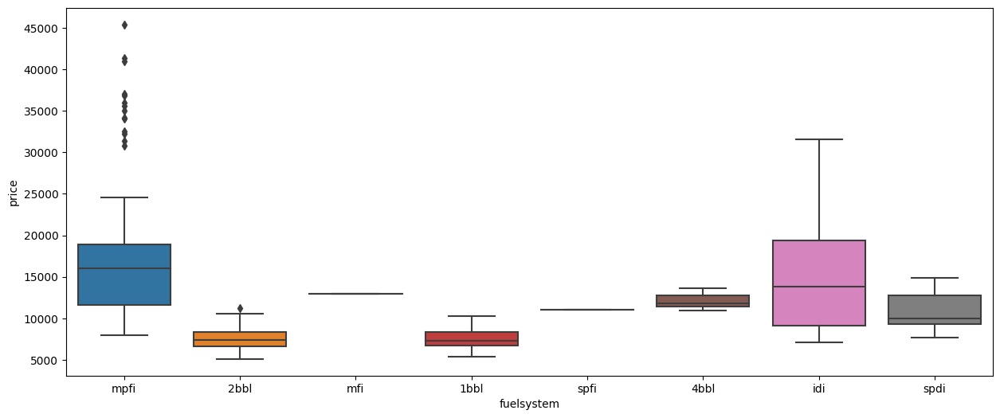

In [38]:
for column in category_column:
    plt.figure(figsize=(15,6))
    create_boxplot("price", column) 

## Data Preprocessing

In [39]:
category_column.remove('doornumber')
category_column.remove('fuelsystem')
category_column.remove('enginelocation')

In [40]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score


In [41]:
#Encoding the categorical variables
encoder = LabelEncoder()

for column in category_column:
    df[column] = encoder.fit_transform(df[column])

In [42]:
df.sample(5)

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
196,197,-2,21,1,0,four,3,2,front,104.3,...,141,mpfi,3.78,3.15,9.5,114,5400,24,28,15985.0
31,32,2,6,1,0,two,2,1,front,86.6,...,92,1bbl,2.91,3.41,9.2,76,6000,31,38,6855.0
189,190,3,20,1,0,two,0,1,front,94.5,...,109,mpfi,3.19,3.40,8.5,90,5500,24,29,11595.0
131,132,2,16,1,0,two,2,1,front,96.1,...,132,mpfi,3.46,3.90,8.7,90,5100,23,31,9895.0
7,8,1,1,1,0,four,4,1,front,105.8,...,136,mpfi,3.19,3.40,8.5,110,5500,19,25,18920.0


In [44]:
drop_columns = ['car_ID','symboling', 'enginelocation', 'doornumber', 
                'fuelsystem','highwaympg','stroke','compressionratio']

df.drop(columns = drop_columns, inplace = True)

In [45]:
#splitting the dataset into training and test datasets
x = df.drop(columns = ['price'])
y = df['price']

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 42)

In [46]:
#scaling the train data
scaler = MinMaxScaler()

x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

## Model Training

In [47]:
#Creating the model

rf = RandomForestRegressor()

rf.fit(x_train,y_train)

RandomForestRegressor()

## Prediction

In [48]:
predict = rf.predict(x_test)

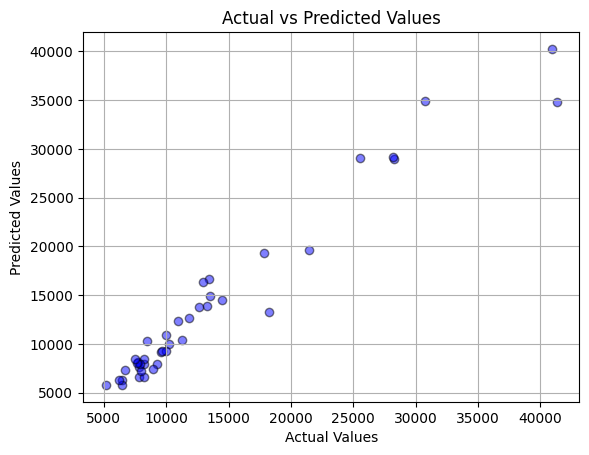

In [49]:
plt.scatter(y_test, predict, alpha=0.5, color='blue', edgecolors='k')

plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)
plt.show()

In [50]:
print("Mean Absolute Error: ", (mean_absolute_error(y_test,predict)).round(2))
print("R2 Score: ", (r2_score(y_test,predict)).round(2))

Mean Absolute Error:  1303.54
R2 Score:  0.95
